<center><img src="redpopcorn.jpg"></center>

**Netflix**! What started in 1997 as a DVD rental service has since exploded into one of the largest entertainment and media companies.

Given the large number of movies and series available on the platform, it is a perfect opportunity to flex your exploratory data analysis skills and dive into the entertainment industry.

You work for a production company that specializes in nostalgic styles. You want to do some research on movies released in the 1990's. You'll delve into Netflix data and perform exploratory data analysis to better understand this awesome movie decade!

You have been supplied with the dataset `netflix_data.csv`, along with the following table detailing the column names and descriptions. Feel free to experiment further after submitting!

## The data
### **netflix_data.csv**
| Column | Description |
|--------|-------------|
| `show_id` | The ID of the show |
| `type` | Type of show |
| `title` | Title of the show |
| `director` | Director of the show |
| `cast` | Cast of the show |
| `country` | Country of origin |
| `date_added` | Date added to Netflix |
| `release_year` | Year of Netflix release |
| `duration` | Duration of the show in minutes |
| `description` | Description of the show |
| `genre` | Show genre |

Perform exploratory data analysis on the netflix_data.csv data to understand more about movies from the 1990s decade.Here are some of the query you can resolve:
* What was the most frequent movie duration in the 1990s? Save an approximate answer as an integer called duration (use 1990 as the decade's start year).
* A movie is considered short if it is less than 90 minutes. Count the number of short action movies released in the 1990s and save this integer as short_movie_count.

Feel free to explore the dataset and use an appropriate visualization as well to summarize your finding.

**Good luck!**

In [ ]:
# Importing pandas and matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read in the Netflix CSV as a DataFrame
netflix_df = pd.read_csv("netflix_data.csv")

In [ ]:
# Start coding here! Use as many cells as you like
netflix_df.head(5000)

,show_id,type,title,director,cast,country,date_added,release_year,duration,description,genre
0,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,93,After a devastating earthquake hits Mexico Cit...,Dramas
1,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,78,"When an army recruit is found dead, his fellow...",Horror Movies
2,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,80,"In a postapocalyptic world, rag-doll robots hi...",Action
3,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,123,A brilliant group of students become card-coun...,Dramas
4,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,"July 1, 2017",2016,1,A genetics professor experiments with a treatm...,International TV
5,s7,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,"June 1, 2020",2019,95,"After an awful accident, a couple admitted to ...",Horror Movies
6,s8,Movie,187,Kevin Reynolds,"Samuel L. Jackson, John Heard, Kelly Rowan, Cl...",United States,"November 1, 2019",1997,119,After one of his high school students attacks ...,Dramas
7,s9,Movie,706,Shravan Kumar,"Divya Dutta, Atul Kulkarni, Mohan Agashe, Anup...",India,"April 1, 2019",2019,118,"When a doctor goes missing, his psychiatrist w...",Horror Movies
8,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,"December 15, 2017",2008,143,An architect and his wife move into a castle t...,Horror Movies
9,s11,Movie,1922,Zak Hilditch,"Thomas Jane, Molly Parker, Dylan Schmid, Kaitl...",United States,"October 20, 2017",2017,103,A farmer pens a confession admitting to his wi...,Dramas


In [ ]:
netflix_df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'duration', 'description', 'genre'],
      dtype='object')

In [ ]:
netflix_df.columns.str.capitalize()

Index(['Show_id', 'Type', 'Title', 'Director', 'Cast', 'Country', 'Date_added',
       'Release_year', 'Duration', 'Description', 'Genre'],
      dtype='object')

In [ ]:
netflix_df.dtypes

,0
show_id,object
type,object
title,object
director,object
cast,object
country,object
date_added,object
release_year,int64
duration,int64
description,object


In [ ]:
import pandas as pd

# Strip leading/trailing spaces to fix inconsistencies
netflix_df['date_added'] = netflix_df['date_added'].str.strip()

# Convert 'date_added' to datetime format, ignoring errors
netflix_df['date_added'] = pd.to_datetime(netflix_df['date_added'], errors='coerce')

# Convert back to string format (YYYY-MM-DD), handling missing values
netflix_df['date_added'] = netflix_df['date_added'].dt.strftime('%Y-%m-%d').fillna('')

# Check data types
print(netflix_df.dtypes)


show_id         object
type            object
title           object
director        object
cast            object
country         object
date_added      object
release_year     int64
duration         int64
description     object
genre           object
dtype: object


In [ ]:
netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,duration,description,genre
0,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,93,After a devastating earthquake hits Mexico Cit...,Dramas
1,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,78,"When an army recruit is found dead, his fellow...",Horror Movies
2,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,80,"In a postapocalyptic world, rag-doll robots hi...",Action
3,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,123,A brilliant group of students become card-coun...,Dramas
4,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2017-07-01,2016,1,A genetics professor experiments with a treatm...,International TV


In [ ]:
netflix_df['show_id']


,show_id
0,s2
1,s3
2,s4
3,s5
4,s6
5,s7
6,s8
7,s9
8,s10
9,s11


In [ ]:
pd.set_option('display.max_rows', None)

# Print dataset
print(netflix_df)

     show_id     type                                              title                                           director                                               cast         country  date_added  release_year  duration                                        description                 genre
0         s2    Movie                                               7:19                                  Jorge Michel Grau  Demián Bichir, Héctor Bonilla, Oscar Serrano, ...          Mexico  2016-12-23          2016        93  After a devastating earthquake hits Mexico Cit...                Dramas
1         s3    Movie                                              23:59                                       Gilbert Chan  Tedd Chan, Stella Chung, Henley Hii, Lawrence ...       Singapore  2018-12-20          2011        78  When an army recruit is found dead, his fellow...         Horror Movies
2         s4    Movie                                                  9                            

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Remove zero-width spaces from the 'title' column
netflix_df['title'] = netflix_df['title'].str.replace(r'\u200b', '', regex=True)

# Define a regex pattern to match invalid titles (numbers, times, dates)
pattern = r'^\d+$|^\d{1,2}:\d{2}$|^\d{1,2}-[A-Za-z]{3}$|^\d{1,4}$|^\d{1,3},\d{3}$|^[A-Za-z]{3}-\d{2}$'

# Replace matches with "No Name"
netflix_df.loc[netflix_df['title'].str.match(pattern, na=False), 'title'] = "No Name"

# Display unique values after cleaning
print(netflix_df['title'].unique())


['No Name' 'Kuch Bheege Alfaaz' 'Goli Soda 2' ... 'Zoom' 'Zozo' 'Zubaan']


In [ ]:
pd.set_option('display.max_rows', None)

# Print dataset
print(netflix_df)

     show_id     type                                              title                                           director                                               cast         country  date_added  release_year  duration                                        description                 genre
0         s2    Movie                                            No Name                                  Jorge Michel Grau  Demián Bichir, Héctor Bonilla, Oscar Serrano, ...          Mexico  2016-12-23          2016        93  After a devastating earthquake hits Mexico Cit...                Dramas
1         s3    Movie                                            No Name                                       Gilbert Chan  Tedd Chan, Stella Chung, Henley Hii, Lawrence ...       Singapore  2018-12-20          2011        78  When an army recruit is found dead, his fellow...         Horror Movies
2         s4    Movie                                            No Name                            

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Remove '#' from the 'title' column
netflix_df['title'] = netflix_df['title'].str.replace(r'^#', '', regex=True)

# Check the unique values after cleaning
print(netflix_df['title'].unique())


['No Name' 'Kuch Bheege Alfaaz' 'Goli Soda 2' ... 'Zoom' 'Zozo' 'Zubaan']


In [ ]:
netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,duration,description,genre
0,s2,Movie,No Name,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,93,After a devastating earthquake hits Mexico Cit...,Dramas
1,s3,Movie,No Name,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,78,"When an army recruit is found dead, his fellow...",Horror Movies
2,s4,Movie,No Name,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,80,"In a postapocalyptic world, rag-doll robots hi...",Action
3,s5,Movie,No Name,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,123,A brilliant group of students become card-coun...,Dramas
4,s6,TV Show,No Name,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2017-07-01,2016,1,A genetics professor experiments with a treatm...,International TV


In [ ]:
#The most frequent movie duration in the 1990

movies_90s = netflix_df[(netflix_df['release_year'] >= 1990) & (netflix_df['release_year'] <= 1999)]
most_frequent_duration = movies_90s['duration'].mode()[0]
print(f"The most frequent movie duration in the 1990s is: {most_frequent_duration}")

The most frequent movie duration in the 1990s is: 94


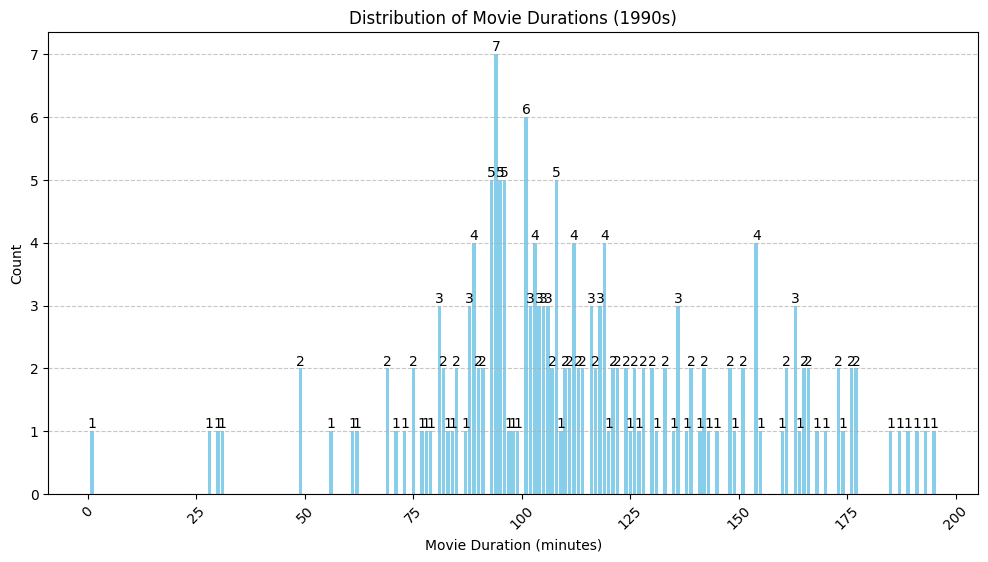

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'duration' is a string and extract numeric values
netflix_df['duration'] = netflix_df['duration'].astype(str).str.extract('(\d+)').astype(float)

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Filter for movies released in the 1990s (1990-1999)
movies_90s = netflix_df[(netflix_df['release_year'] >= 1990) & (netflix_df['release_year'] < 2000)]

# Drop NaN values after extraction
movies_90s = movies_90s.dropna(subset=['duration'])

# Count occurrences of each duration
duration_counts = movies_90s['duration'].value_counts().sort_index()

# Plot the data
plt.figure(figsize=(12, 6))
bars = plt.bar(duration_counts.index, duration_counts.values, color='skyblue')

# Add data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.xlabel("Movie Duration (minutes)")
plt.ylabel("Count")
plt.title("Distribution of Movie Durations (1990s)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

In [ ]:
# Assuming your DataFrame is named netflix_df

# Filter for action movies
action_movies = netflix_df[netflix_df['genre'].str.contains('Action', na=False, case=False)]

# Filter for short movies (< 90 minutes)
short_action_movies = action_movies[action_movies['duration'] < 90]

# Filter for movies released in the 1990s (1990-1999)
short_action_movies_90s = short_action_movies[(short_action_movies['release_year'] >= 1990) & (short_action_movies['release_year'] <= 1999)]

# Count the number of matching movies
short_movie_count = short_action_movies_90s.shape[0]

print(short_movie_count)  # Output the count


7


In [ ]:
#Question 2
#A movie is considered short if it is less than 90 minutes.
#Count the number of short action movies released in the 1990s and save this integer as short_movie_count.

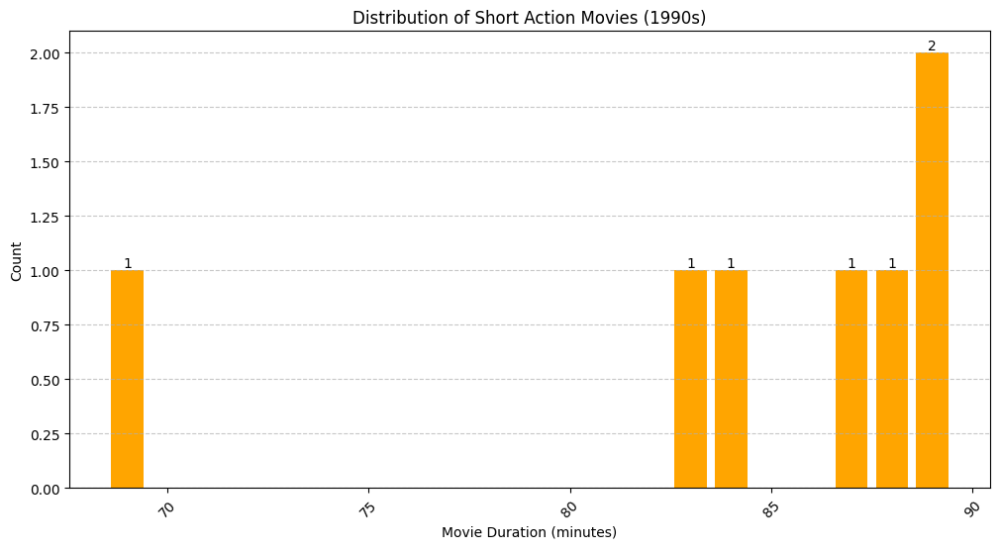

Total short action movies in the 1990s: 7


In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'duration' is numeric
netflix_df['duration'] = netflix_df['duration'].astype(str).str.extract('(\d+)').astype(float)

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Filter for movies released in the 1990s (1990-1999)
movies_90s = netflix_df[(netflix_df['release_year'] >= 1990) & (netflix_df['release_year'] < 2000)]

# Drop NaN values after extraction
movies_90s = movies_90s.dropna(subset=['duration'])

# Filter for short movies (< 90 minutes)
short_movies = movies_90s[movies_90s['duration'] < 90]

# Filter for action movies (assuming 'genre' column exists)
short_action_movies = short_movies[short_movies['genre'].str.contains('Action', na=False, case=False)]

# Count occurrences of each duration
duration_counts = short_action_movies['duration'].value_counts().sort_index()

# Store the total count of short action movies
short_movie_count = short_action_movies.shape[0]

# Plot the data
plt.figure(figsize=(12, 6))
bars = plt.bar(duration_counts.index, duration_counts.values, color='orange')

# Add data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.xlabel("Movie Duration (minutes)")
plt.ylabel("Count")
plt.title("Distribution of Short Action Movies (1990s)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Print total count
print("Total short action movies in the 1990s:", short_movie_count)


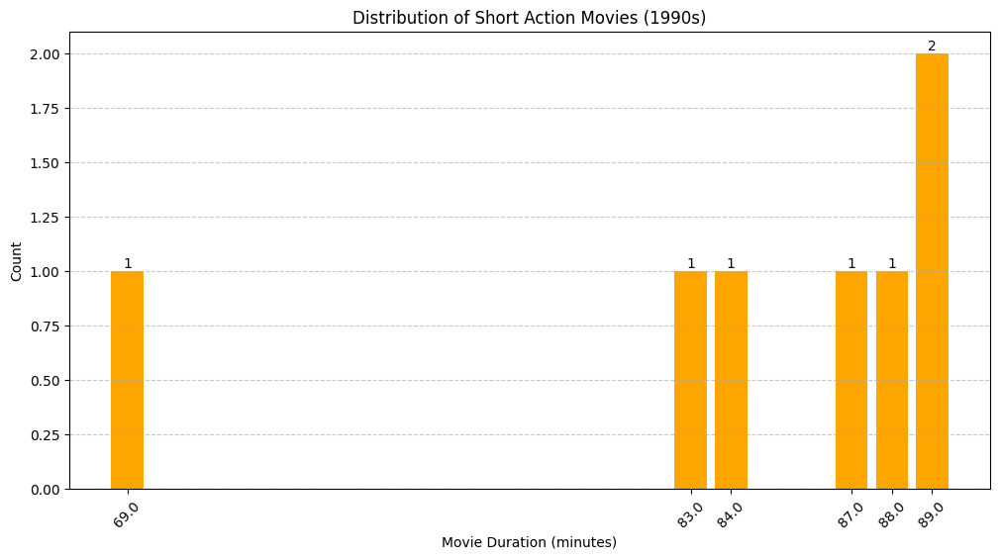

Total short action movies in the 1990s: 7


In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'duration' is numeric
netflix_df['duration'] = netflix_df['duration'].astype(str).str.extract('(\d+)').astype(float)

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Filter for movies released in the 1990s (1990-1999)
movies_90s = netflix_df[(netflix_df['release_year'] >= 1990) & (netflix_df['release_year'] < 2000)]

# Drop NaN values after extraction
movies_90s = movies_90s.dropna(subset=['duration'])

# Filter for short movies (< 90 minutes)
short_movies = movies_90s[movies_90s['duration'] < 90]

# Filter for action movies (assuming 'genre' column exists)
short_action_movies = short_movies[short_movies['genre'].str.contains('Action', na=False, case=False)]

# Count occurrences of each duration
duration_counts = short_action_movies['duration'].value_counts().sort_index()

# Store the total count of short action movies
short_movie_count = short_action_movies.shape[0]

# Plot the data
plt.figure(figsize=(12, 6))
bars = plt.bar(duration_counts.index, duration_counts.values, color='orange')

# Add data labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.xlabel("Movie Duration (minutes)")
plt.ylabel("Count")
plt.title("Distribution of Short Action Movies (1990s)")

# Ensure all x-axis labels are displayed
plt.xticks(ticks=duration_counts.index, labels=duration_counts.index, rotation=45)

plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Print total count
print("Total short action movies in the 1990s:", short_movie_count)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Count total movies per year and get top 10 years with highest movie releases
movies_per_year = netflix_df.groupby('release_year').size().reset_index(name='count')
top_10_years = movies_per_year.nlargest(10, 'count').sort_values('release_year')

# Print the table
print("Top 10 Years with Highest Movie Releases:")
print(top_10_years.to_string(index=False))

# Extend color palette to match the number of bars
colors = ["#F1FFFA", "#CCFCCB", "#96E6B3", "#568259", "#464E47"] * 2  # Duplicate to ensure 10 colors

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the bar chart
ax = sns.barplot(
    x=top_10_years['release_year'],
    y=top_10_years['count'],
    hue=top_10_years['release_year'],  # Assign hue to fix FutureWarning
    palette=colors[:10],  # Ensure exactly 10 colors
    legend=False  # Hide legend
)

# Labels and title
plt.xlabel("Year")
plt.ylabel("Number of Movies Produced")
plt.title("Top 10 Years with Highest Movie Releases")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add data labels
for index, row in top_10_years.iterrows():
    ax.text(row['release_year'], row['count'] + 5, str(row['count']), ha='center', fontsize=10)

# Show the plot
plt.show()

Top 10 Years with Highest Movie Releases:
 release_year  count
         2010    125
         2012    150
         2013    183
         2014    224
         2015    340
         2016    562
         2017    646
         2018    624
         2019    488
         2020    379


Top 10 Years with Highest Movie Releases:
 release_year  count
         2010    125
         2012    150
         2013    183
         2014    224
         2015    340
         2016    562
         2017    646
         2018    624
         2019    488
         2020    379


<ipython-input-163-36e9facd31a5>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


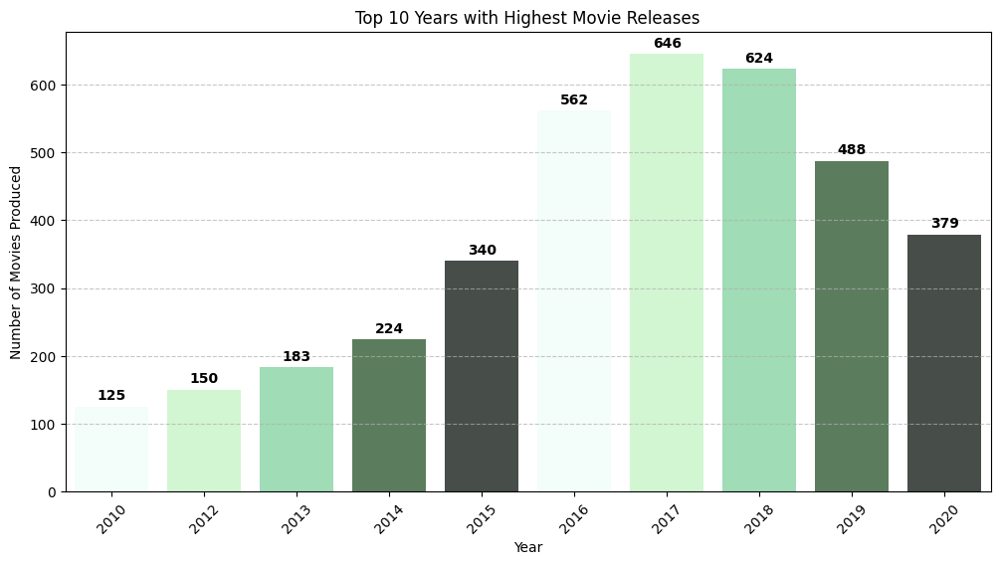

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure inline plotting (for Jupyter Notebook)
%matplotlib inline

# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Count total movies per year and get top 10 years with highest movie releases
movies_per_year = netflix_df.groupby('release_year').size().reset_index(name='count')
top_10_years = movies_per_year.nlargest(10, 'count').sort_values('release_year')

# Print the table
print("Top 10 Years with Highest Movie Releases:")
print(top_10_years.to_string(index=False))

# Define colors (extended for 10 bars)
colors = ["#F1FFFA", "#CCFCCB", "#96E6B3", "#568259", "#464E47"] * 2

# Plot bar chart
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=top_10_years['release_year'].astype(str),  # Convert to string for better X-axis labels
    y=top_10_years['count'],
    palette=colors[:10]
)

# Labels and title
plt.xlabel("Year")
plt.ylabel("Number of Movies Produced")
plt.title("Top 10 Years with Highest Movie Releases")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add data labels on top of the bars
for index, row in enumerate(top_10_years.itertuples()):
    ax.text(index, row.count + 10, str(row.count), ha='center', fontsize=10, fontweight='bold')

# Show the chart
plt.show()


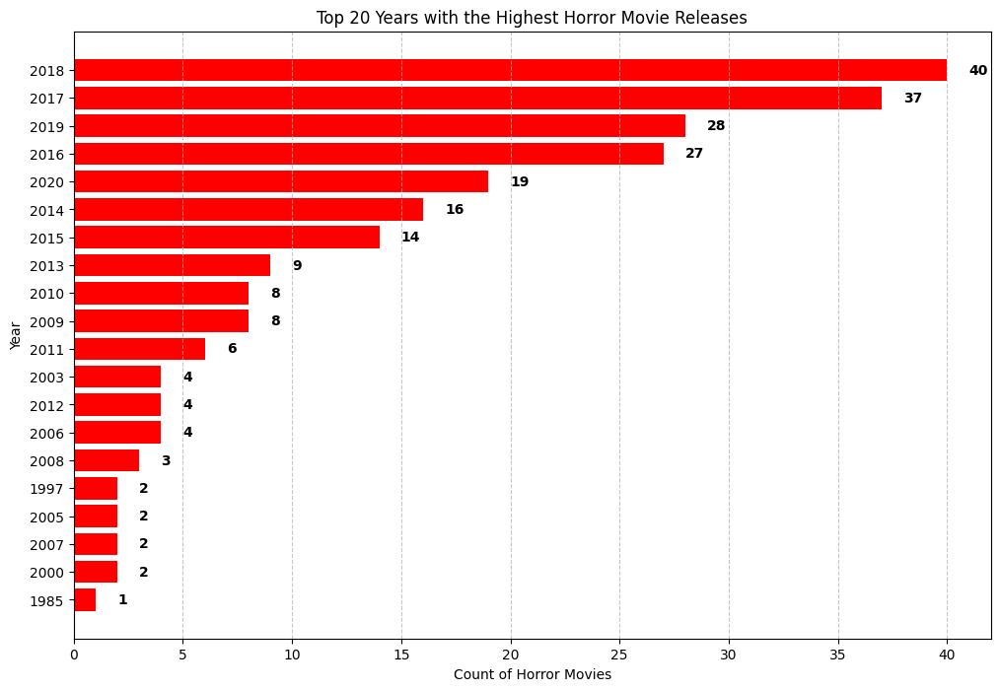

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Filter horror movies
horror_movies = netflix_df[netflix_df['genre'].str.contains('Horror', na=False, case=False)]

# Count horror movies per year
horror_counts = horror_movies['release_year'].value_counts().sort_values(ascending=False)

# Select the top 20 years
top_20_years = horror_counts.head(20)

# Plot the data as a horizontal bar chart
plt.figure(figsize=(12, 8))  # Adjust height for readability
bars = plt.barh(top_20_years.index.astype(str), top_20_years.values, color='red')

# Add data labels on the bars
for bar in bars:
    xval = bar.get_width()  # Get count of movies
    plt.text(xval + 1, bar.get_y() + bar.get_height()/2, str(int(xval)),
             ha='left', va='center', fontsize=10, fontweight='bold')

plt.xlabel("Count of Horror Movies")
plt.ylabel("Year")
plt.title("Top 20 Years with the Highest Horror Movie Releases")
plt.gca().invert_yaxis()  # Invert y-axis to show highest first
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


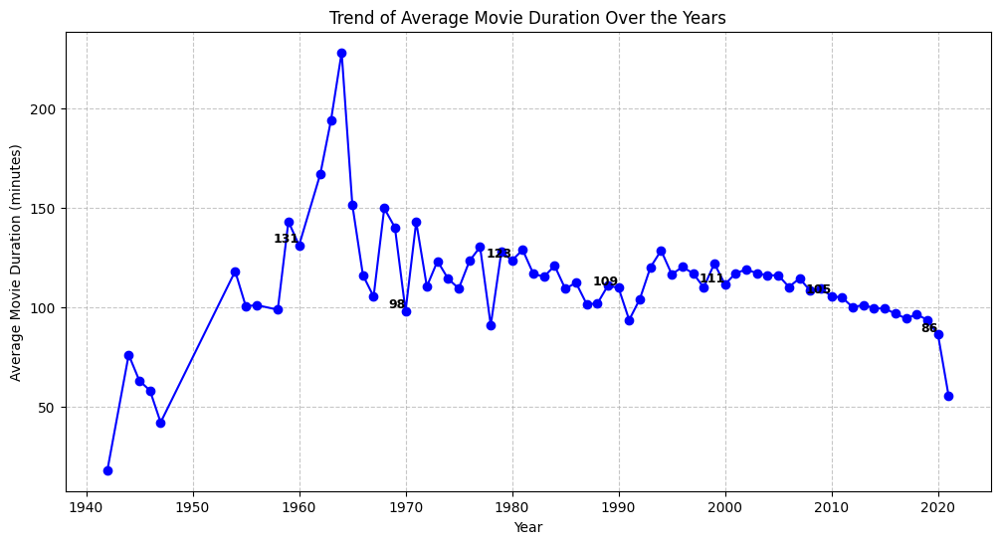

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'duration' is a string and extract numeric values
netflix_df['duration'] = netflix_df['duration'].astype(str).str.extract('(\d+)').astype(float)

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Group by year and calculate the average duration
avg_duration_per_year = netflix_df.groupby('release_year')['duration'].mean()

# Drop NaN values
avg_duration_per_year = avg_duration_per_year.dropna()

# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(avg_duration_per_year.index, avg_duration_per_year.values, marker='o', linestyle='-', color='blue')

# Add data labels for better readability at key points
for year, duration in avg_duration_per_year.items():
    if year % 10 == 0:  # Show labels every 10 years to avoid clutter
        plt.text(year, duration, f"{int(duration)}", ha='right', va='bottom', fontsize=9, fontweight='bold')

plt.xlabel("Year")
plt.ylabel("Average Movie Duration (minutes)")
plt.title("Trend of Average Movie Duration Over the Years")
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

<ipython-input-166-0c63a044c0d1>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  netflix_df['country'].fillna("Unknown", inplace=True)


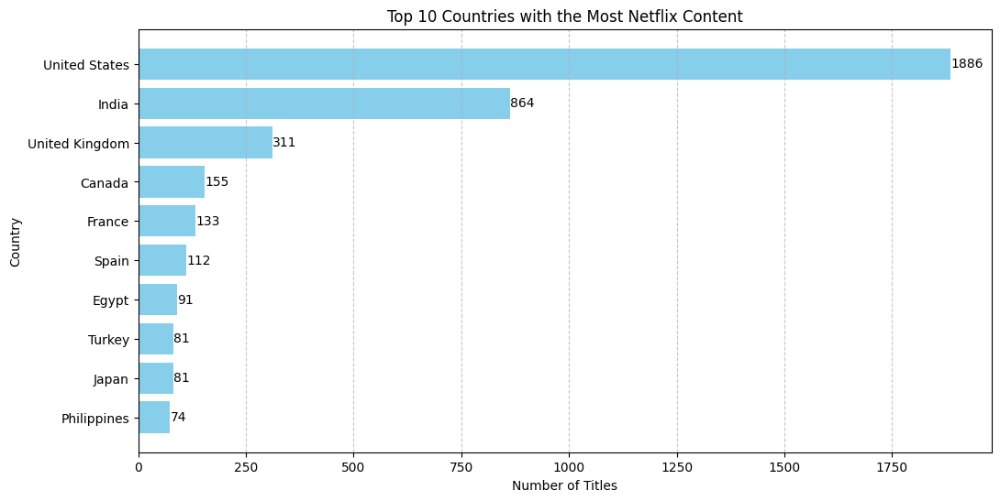

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Fill missing country values
netflix_df['country'].fillna("Unknown", inplace=True)

# Split multiple countries in a single row and count individually
countries_split = netflix_df['country'].str.split(', ').explode()

# Count occurrences of each country
top_countries = countries_split.value_counts().head(10)

# Plot the data
plt.figure(figsize=(12, 6))
bars = plt.barh(top_countries.index[::-1], top_countries.values[::-1], color='skyblue')

# Add data labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, int(bar.get_width()),
             ha='left', va='center', fontsize=10)

plt.xlabel("Number of Titles")
plt.ylabel("Country")
plt.title("Top 10 Countries with the Most Netflix Content")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


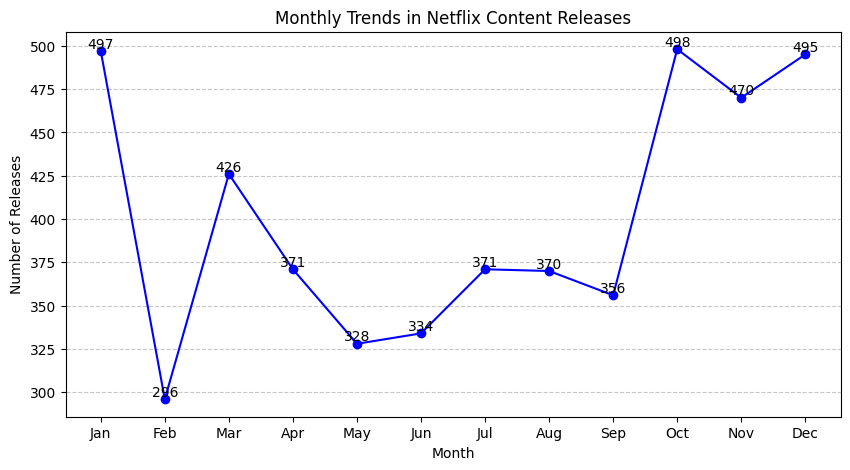

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Convert 'date_added' to datetime format
netflix_df['date_added'] = pd.to_datetime(netflix_df['date_added'], errors='coerce')

# Extract month from 'date_added'
netflix_df['month'] = netflix_df['date_added'].dt.month

# Count number of releases per month
monthly_trends = netflix_df['month'].value_counts().sort_index()

# Define month labels
month_labels = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# Plot the data
plt.figure(figsize=(10, 5))
plt.plot(month_labels, monthly_trends, marker='o', linestyle='-', color='b')

# Add data labels
for i, txt in enumerate(monthly_trends):
    plt.text(i, txt, int(txt), ha='center', va='bottom', fontsize=10)

plt.xlabel("Month")
plt.ylabel("Number of Releases")
plt.title("Monthly Trends in Netflix Content Releases")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


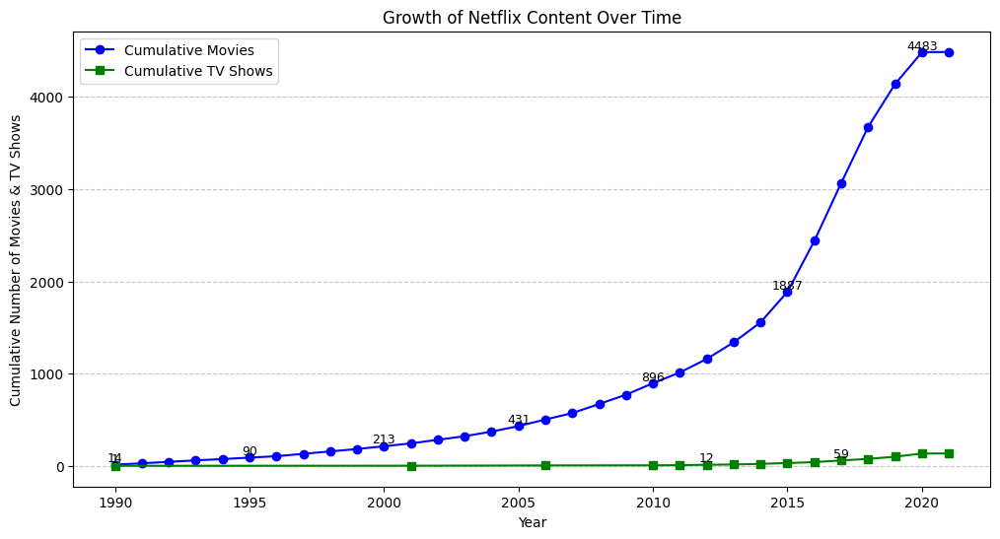

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Filter out invalid years (assuming Netflix started in the late 1990s)
netflix_df = netflix_df[netflix_df['release_year'] >= 1990]

# Separate Movies and TV Shows
movies = netflix_df[netflix_df['type'] == "Movie"]
tv_shows = netflix_df[netflix_df['type'] == "TV Show"]

# Count number of movies & TV shows released per year
movies_count = movies['release_year'].value_counts().sort_index()
tv_shows_count = tv_shows['release_year'].value_counts().sort_index()

# Calculate cumulative sum to show growth over time
cumulative_movies = movies_count.cumsum()
cumulative_tv_shows = tv_shows_count.cumsum()

# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(cumulative_movies.index, cumulative_movies.values, marker='o', linestyle='-', color='b', label="Cumulative Movies")
plt.plot(cumulative_tv_shows.index, cumulative_tv_shows.values, marker='s', linestyle='-', color='g', label="Cumulative TV Shows")

# Add data labels for key points
for i in range(0, len(cumulative_movies), 5):  # Label every 5th point
    plt.text(cumulative_movies.index[i], cumulative_movies.values[i], int(cumulative_movies.values[i]), ha='center', va='bottom', fontsize=9)
for i in range(0, len(cumulative_tv_shows), 5):
    plt.text(cumulative_tv_shows.index[i], cumulative_tv_shows.values[i], int(cumulative_tv_shows.values[i]), ha='center', va='bottom', fontsize=9)

plt.xlabel("Year")
plt.ylabel("Cumulative Number of Movies & TV Shows")
plt.title("Growth of Netflix Content Over Time")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


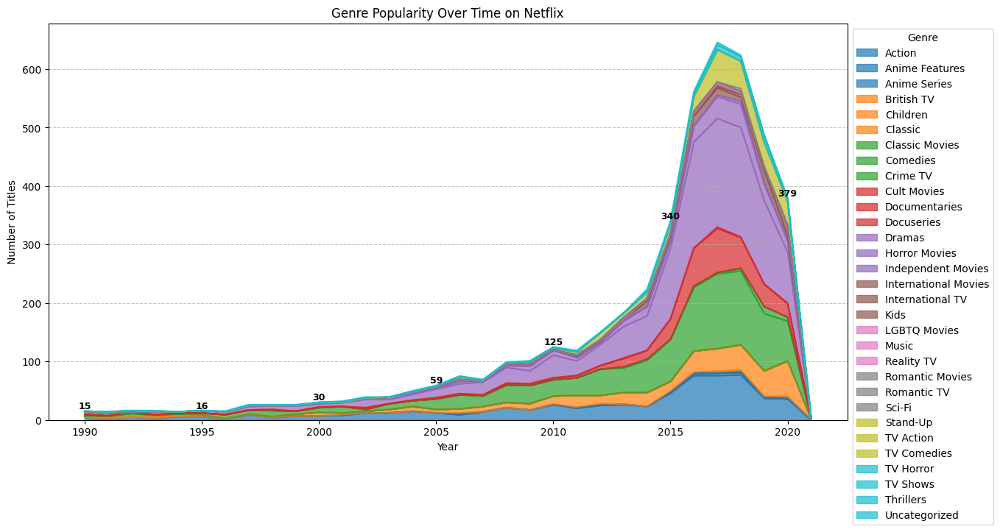

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Drop rows with missing release_year or genre
netflix_df = netflix_df.dropna(subset=['release_year', 'genre'])

# Normalize genre column (splitting multiple genres per title)
netflix_df['genre'] = netflix_df['genre'].str.split(', ')
netflix_exploded = netflix_df.explode('genre')

# Count the number of movies/shows per genre per year
genre_counts = netflix_exploded.groupby(['release_year', 'genre']).size().unstack().fillna(0)

# Create the figure
fig, ax = plt.subplots(figsize=(14, 7))

# Plot the stacked area chart
genre_counts.plot(kind='area', stacked=True, alpha=0.7, colormap='tab10', ax=ax)

# Add Data Labels (Total count per year)
total_per_year = genre_counts.sum(axis=1)  # Summing all genres per year

for year, total in total_per_year.items():
    if year % 5 == 0:  # Display label every 5 years to prevent clutter
        ax.text(year, total, f"{int(total)}",
                ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')

# Formatting the chart
plt.xlabel("Year")
plt.ylabel("Number of Titles")
plt.title("Genre Popularity Over Time on Netflix")
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), title="Genre")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

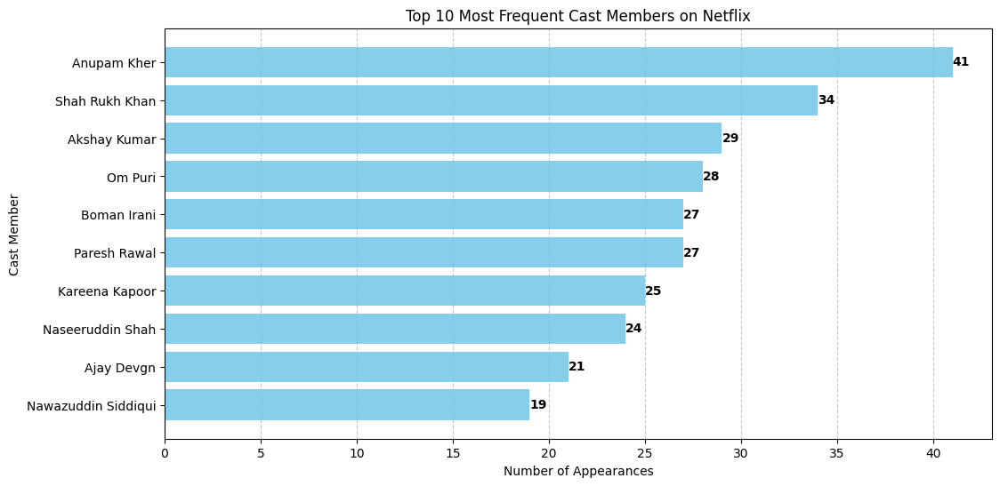

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Drop rows with missing cast information
netflix_df = netflix_df.dropna(subset=['cast'])

# Normalize 'cast' column (split multiple actors per title)
netflix_df['cast'] = netflix_df['cast'].str.split(', ')
netflix_exploded = netflix_df.explode('cast')

# Count occurrences of each actor
top_cast = netflix_exploded['cast'].value_counts().head(10)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(top_cast.index[::-1], top_cast.values[::-1], color='skyblue')

# Add data labels
for bar in bars:
    ax.text(bar.get_width(), bar.get_y() + bar.get_height()/2, str(int(bar.get_width())),
            va='center', ha='left', fontsize=10, fontweight='bold')

# Formatting
plt.xlabel("Number of Appearances")
plt.ylabel("Cast Member")
plt.title("Top 10 Most Frequent Cast Members on Netflix")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

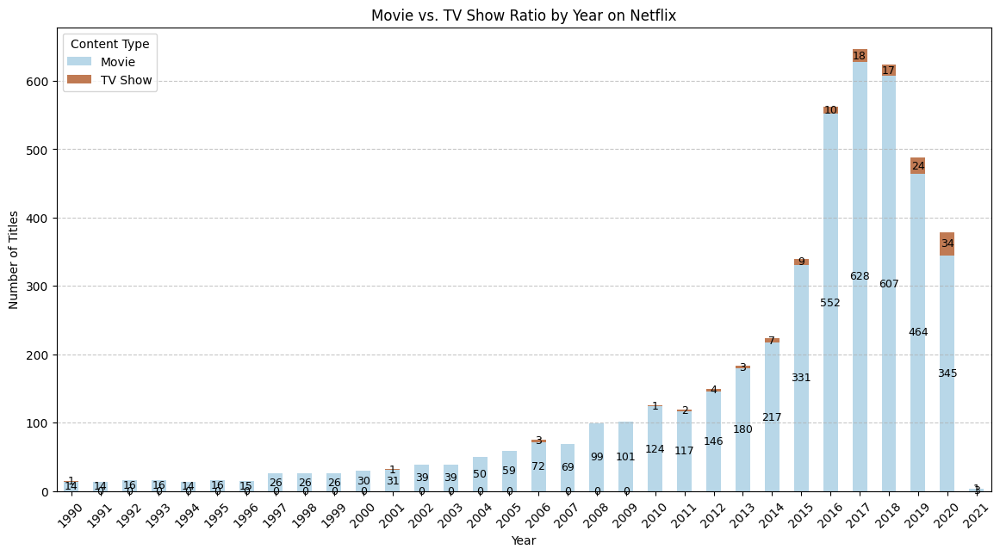

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Ensure 'release_year' is numeric
netflix_df['release_year'] = pd.to_numeric(netflix_df['release_year'], errors='coerce')

# Drop rows with missing release_year or type
netflix_df = netflix_df.dropna(subset=['release_year', 'type'])

# Count the number of movies and TV shows per year
content_counts = netflix_df.groupby(['release_year', 'type']).size().unstack().fillna(0)

# Plot the stacked bar chart
fig, ax = plt.subplots(figsize=(14, 7))
content_counts.plot(kind='bar', stacked=True, colormap='Paired', ax=ax, alpha=0.8)

# Add data labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='center', fontsize=9, color='black')

# Formatting
plt.xlabel("Year")
plt.ylabel("Number of Titles")
plt.title("Movie vs. TV Show Ratio by Year on Netflix")
plt.legend(title="Content Type", loc="upper left")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

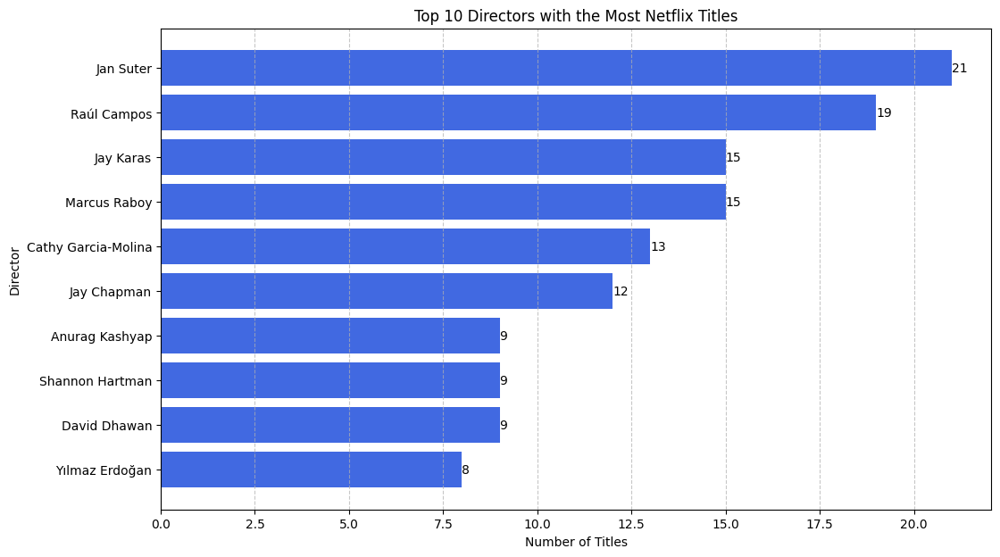

In [ ]:
# Strip spaces from column names
netflix_df.columns = netflix_df.columns.str.strip()

# Drop missing values in the 'director' column
netflix_df = netflix_df.dropna(subset=['director'])

# Normalize the 'director' column (handling multiple directors per title)
netflix_df['director'] = netflix_df['director'].str.split(', ')
netflix_exploded = netflix_df.explode('director')

# Count the number of titles per director
director_counts = netflix_exploded['director'].value_counts().head(10)

# Plot the horizontal bar chart
fig, ax = plt.subplots(figsize=(12, 7))
bars = ax.barh(director_counts.index[::-1], director_counts.values[::-1], color='royalblue')

# Add data labels
for bar in bars:
    ax.text(bar.get_width(), bar.get_y() + bar.get_height()/2,
            f'{int(bar.get_width())}', va='center', ha='left', fontsize=10)

# Formatting
plt.xlabel("Number of Titles")
plt.ylabel("Director")
plt.title("Top 10 Directors with the Most Netflix Titles")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show the plot
plt.show()